# Introduction

The selected final project that we will work on is **Image Classification** to classify the images of **pharmaceutical drugs**. The goal is to develop a deep learning model that can accurately classify these images into their respective categories. We hope that by developing this model, **public can classify the name of pharmaceutical drugs easily only with images**, so they do not get the drugs mixed up when requesting for something in the pharmacy.

The input of this model will be synthetic images of pharmaceutical drugs and vitamins. The output will be the predicted class label corresponding to the drug or vitamin in the image.

Metrics that we will use for evaluation are Recall and F1 Score, more will be explained below.

Pharmaceutical drug and vitamin identification is crucial for ensuring patient safety and improving inventory management in pharmacies. Deep learning models, particularly convolutional neural networks (CNNs), have proven effective in image classification tasks and can automate the process of recognizing and categorizing medicines accurately.

The dataset used is the [Pharmaceutical Drugs and Vitamins Synthetic Images](https://www.kaggle.com/datasets/vencerlanz09/pharmaceutical-drugs-and-vitamins-synthetic-images) dataset from Kaggle. This dataset consists of labeled synthetic images of various drugs and vitamins, making it a valuable resource for training a deep learning model to classify different pharmaceutical products.


In [8]:
import os
import shutil
import cv2
import pandas as pd
import numpy as np
from datetime import datetime
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow import keras
import json
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras import models, layers
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.metrics import classification_report
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.models import Model
from tensorflow.keras.metrics import Precision, Recall
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.applications.resnet_v2 import preprocess_input as preprocess_resnet50v2
from tensorflow.keras.applications.efficientnet import preprocess_input as preprocess_efficientnetb0
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, ReLU, Input, GlobalAveragePooling2D

SEED_VALUE = 1234
np.random.seed(SEED_VALUE)
import random
random.seed(SEED_VALUE)
tf.random.set_seed(SEED_VALUE)

# Read Data

We will use 80% data for training, 10% data for testing, and 10% data for validation. The original number of data is 10000, with 1000 images x 10 classes. Since we have sufficient data points, having 80% train is more than enough (8000 data points) to fit the model.

---

The seed is used to have reproducible result, which means, when we run it on different time/device, it will reproduce the almost-the-same result (so the model is more reliable).


In [3]:
def split_dataset(base_dir, output_dir, train_ratio=0.9, seed=42):
    random.seed(seed)
    class_names = os.listdir(base_dir)
    for class_name in class_names:
        class_dir = os.path.join(base_dir, class_name)
        if not os.path.isdir(class_dir):
            continue

        images = os.listdir(class_dir)
        random.shuffle(images)
        train_cutoff = int(train_ratio * len(images))

        train_images = images[:train_cutoff]
        test_images = images[train_cutoff:]

        for split_name, split_images in [("train", train_images), ("test", test_images)]:
            split_class_dir = os.path.join(output_dir, split_name, class_name)
            os.makedirs(split_class_dir, exist_ok=True)

            for image_name in split_images:
                src = os.path.join(class_dir, image_name)
                dst = os.path.join(split_class_dir, image_name)
                shutil.copy2(src, dst)

base_data = "/kaggle/input/pharmaceutical-drugs-and-vitamins-synthetic-images/Drug Vision/Data Combined"
output_data = "/kaggle/working/split_data"
split_dataset(base_data, output_data)

After splitting the train & test data 90:10, we further split the train to train & val data so it can create train:test:val = 80:10:10. To achieve this number, the validation_split is set to 10/90 = 0.111112. Splitting the data is necessary because we want to train the model only using the training data to avoid data leakage (so the model does not have hint on unseen data/test data). We will validate the model using validation data, and finally predict the results using test data, and evaluate the result.


In [9]:
image_size = (224, 224)
batch_size = 32
path = "/kaggle/working/split_data"

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    os.path.join(path, "train"),
    validation_split=0.111112,
    subset="training",
    seed=SEED_VALUE,
    image_size=image_size,
    batch_size=batch_size,
    label_mode='int'
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    os.path.join(path, "train"),
    validation_split=0.111112,
    subset="validation",
    seed=SEED_VALUE,
    image_size=image_size,
    batch_size=batch_size,
    label_mode='int'
)

test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    os.path.join(path, "test"),
    image_size=image_size,
    batch_size=batch_size,
    label_mode='int'
)


Found 9000 files belonging to 10 classes.
Using 8000 files for training.
Found 9000 files belonging to 10 classes.
Using 1000 files for validation.
Found 1000 files belonging to 10 classes.


# Exploratory Data Analysis (EDA)

The first EDA step to do is to see the sample images from each label to get a general overview of how each label looks like.


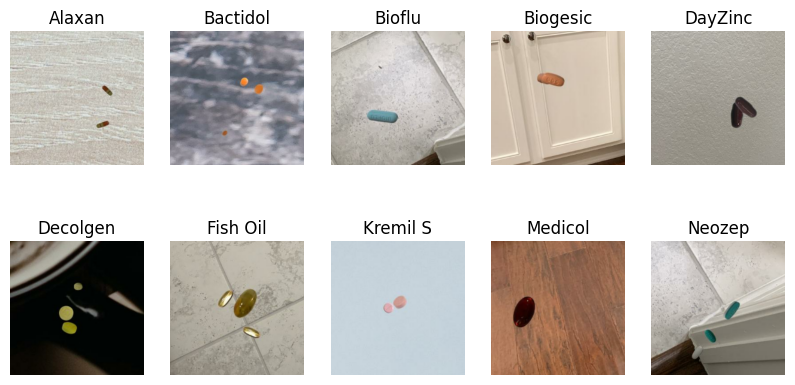

In [5]:
plt.figure(figsize=(10, 5))
for i, class_name in enumerate(train_ds.class_names):
    for images, labels in train_ds:
        for j in range(len(images)):
            if labels[j].numpy() == i:
                plt.subplot(2, 5, i + 1)
                plt.imshow(images[j].numpy().astype("uint8"))
                plt.title(class_name)
                plt.axis("off")
                break
        else:
            continue
        break

plt.show()


In [6]:
class_names = train_ds.class_names
class_names

['Alaxan',
 'Bactidol',
 'Bioflu',
 'Biogesic',
 'DayZinc',
 'Decolgen',
 'Fish Oil',
 'Kremil S',
 'Medicol',
 'Neozep']

The images above are the sample from each class in training dataset. There are 10 classes, so there are 10 outputs shown in the picture. The pills, although look the same, may pose different characteristics compared to each class. The image is in color, so it is presumed to be in RGB scale.

---

The second step is to check the data distribution between each label, which proves that our dataset has a balanced distribution. From 10.000 images, they are distributed equally between each label, so each has 1.000 images.


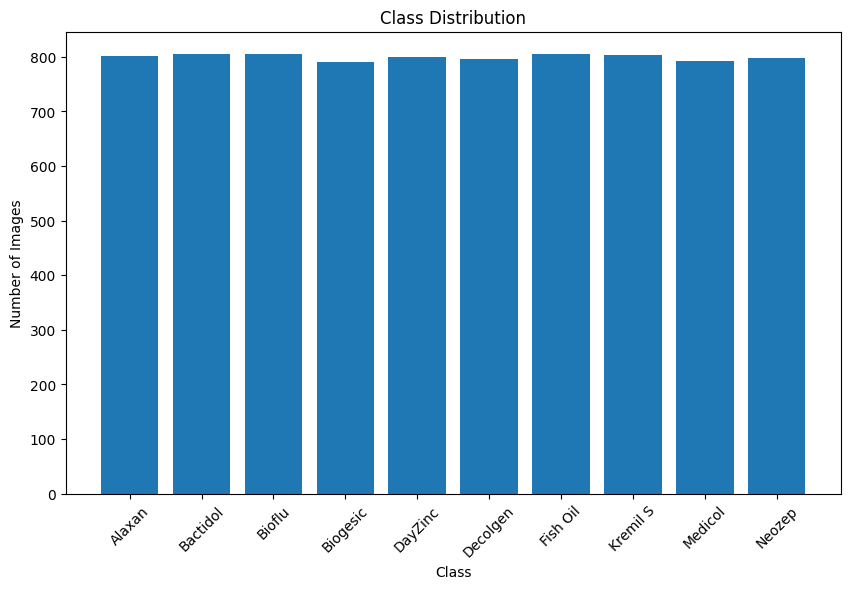

In [7]:
def plot_class_distribution(dataset):
    class_counts = [0] * len(dataset.class_names)

    for image_batch, label_batch in dataset:
        for label in label_batch:
            label_value = int(label.numpy())
            class_counts[label_value] += 1

    plt.figure(figsize=(10, 6))
    plt.bar(dataset.class_names, class_counts)
    plt.title('Class Distribution')
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.xticks(rotation=45)
    plt.show()

plot_class_distribution(train_ds)

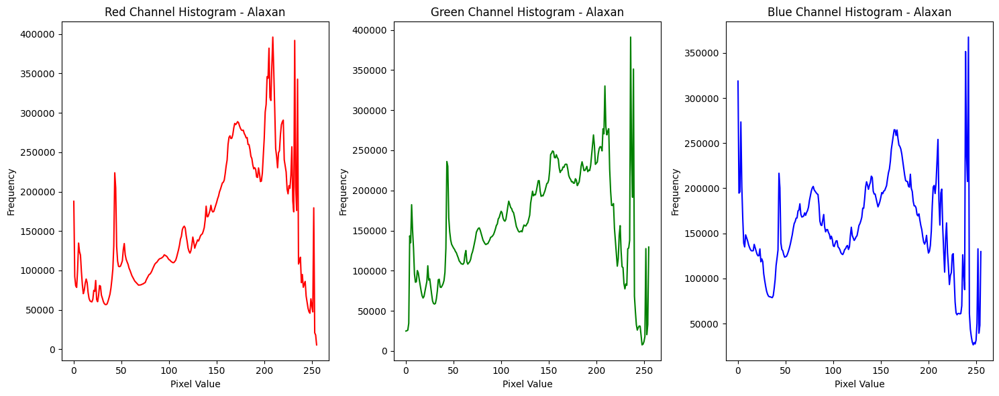

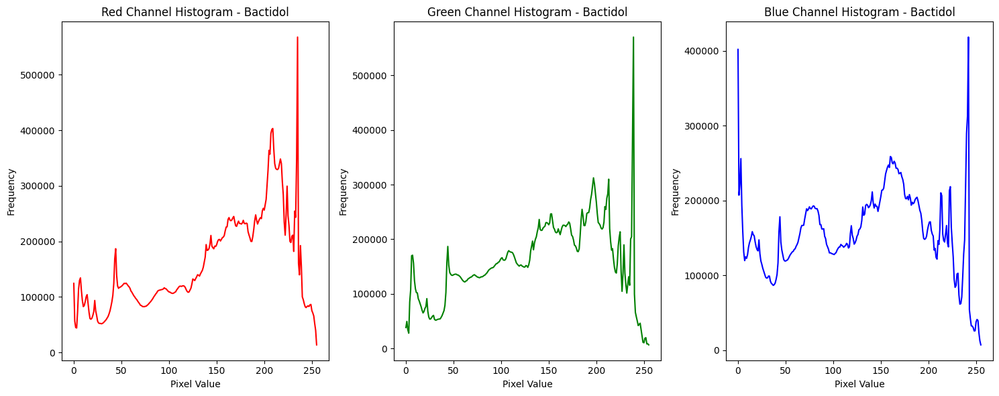

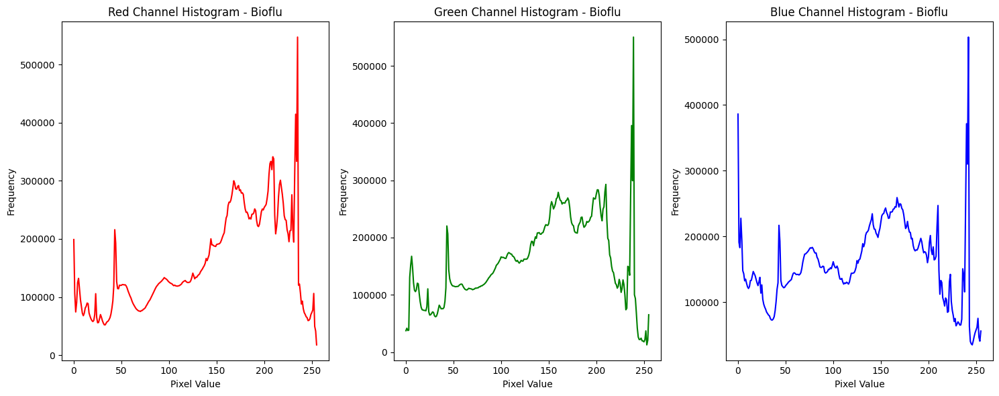

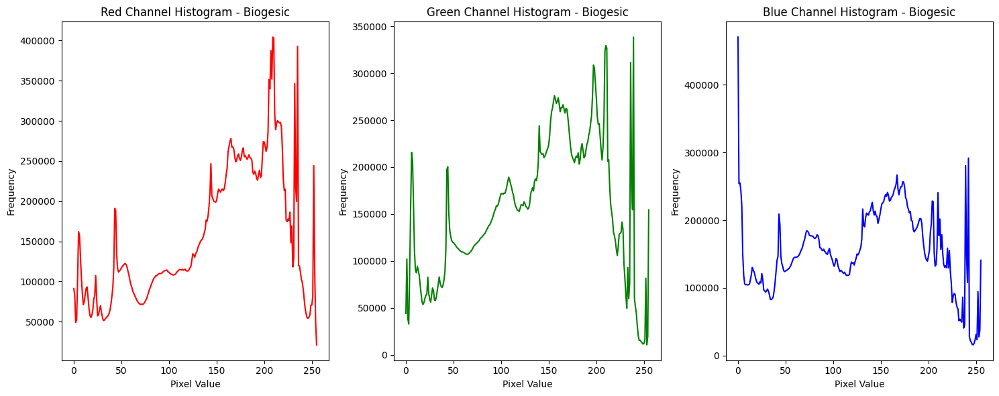

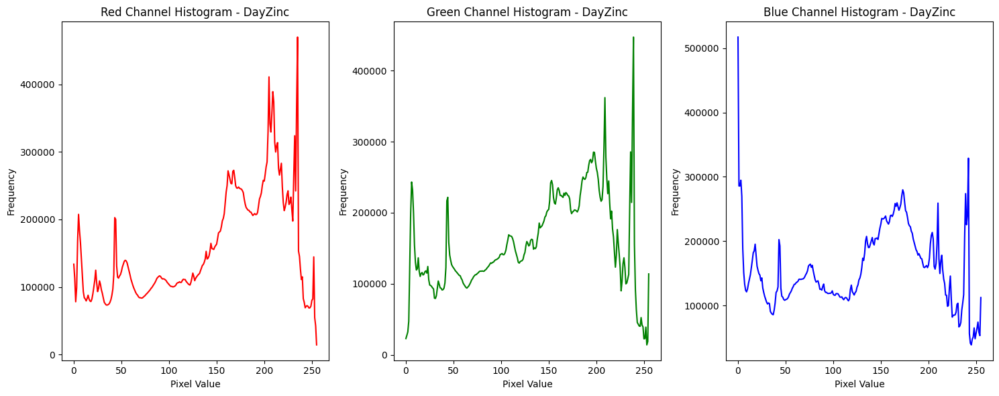

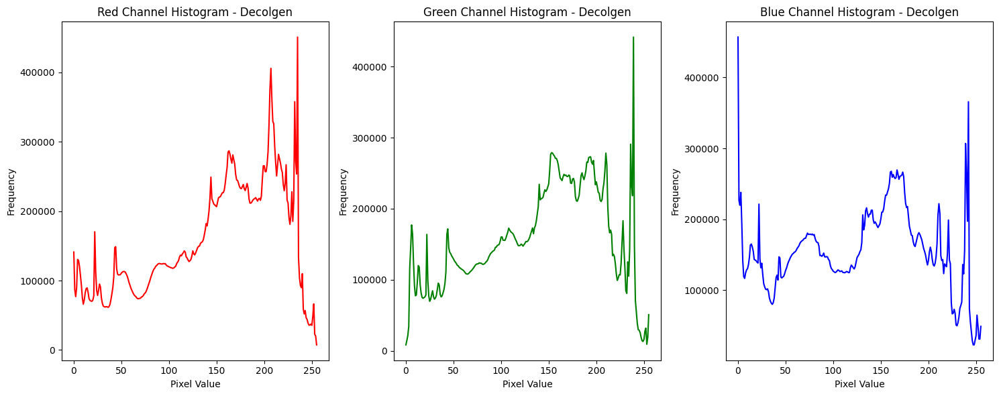

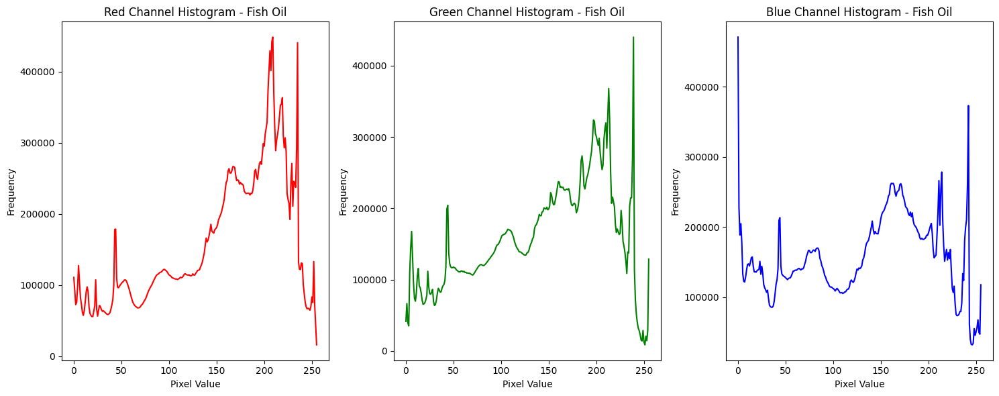

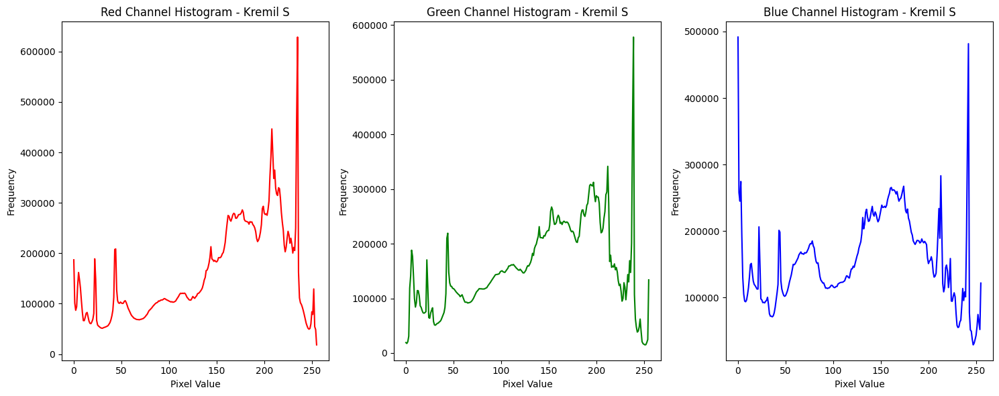

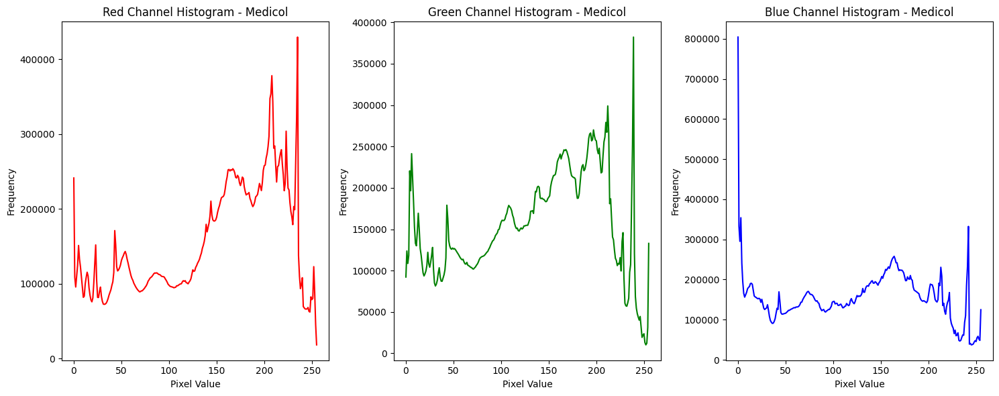

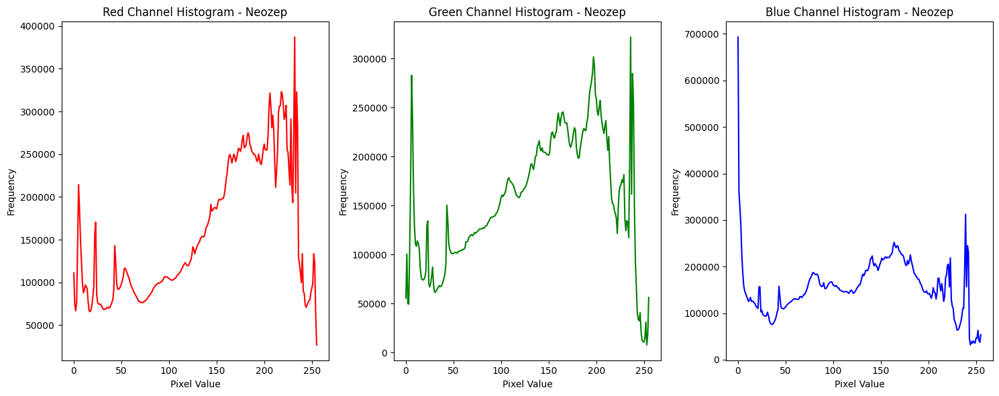

In [8]:
def plot_rgb_histogram_per_class(dataset, class_names):
    for class_idx, class_name in enumerate(class_names):
        red_hist = np.zeros(256)
        green_hist = np.zeros(256)
        blue_hist = np.zeros(256)

        for images, label_batch in dataset:
            images_np = images.numpy()
            label_np = label_batch.numpy()

            class_mask = (label_np == class_idx)
            images_class = images_np[class_mask]

            if len(images_class) == 0:
                continue

            red_hist += np.histogram(images_class[:, :, :, 0].flatten(), bins=256, range=(0, 256))[0]
            green_hist += np.histogram(images_class[:, :, :, 1].flatten(), bins=256, range=(0, 256))[0]
            blue_hist += np.histogram(images_class[:, :, :, 2].flatten(), bins=256, range=(0, 256))[0]

        plt.figure(figsize=(15, 6))

        plt.subplot(1, 3, 1)
        plt.plot(red_hist, color='red')
        plt.title(f'Red Channel Histogram - {class_name}')
        plt.xlabel('Pixel Value')
        plt.ylabel('Frequency')

        plt.subplot(1, 3, 2)
        plt.plot(green_hist, color='green')
        plt.title(f'Green Channel Histogram - {class_name}')
        plt.xlabel('Pixel Value')
        plt.ylabel('Frequency')

        plt.subplot(1, 3, 3)
        plt.plot(blue_hist, color='blue')
        plt.title(f'Blue Channel Histogram - {class_name}')
        plt.xlabel('Pixel Value')
        plt.ylabel('Frequency')

        plt.tight_layout()
        plt.show()

plot_rgb_histogram_per_class(train_ds, class_names)

From the RGB histograms:

- **Alaxan, Bactidol, Bioflu**: All histograms show peak around 255 which means the images are generally bright
- **Biogesic, Fish Oil, Kremil S**: Images are also bright because many values peak near 255 (near white), but we can see that the blue peak is lower than red and green, which suggests that the images may be warmer compared to Alaxan, Bactidol, and Bioflu with higher blue tone.
- **DayZinc, Decolgen, Medicol, Neozep**: Images are also bright because the values peak near 255, and these images are the warmest tone because they lack of blue color, as seen on the low blue value in the histogram.

**Key takeaways**: All images are bright because the RGB values peak near 255, or close to white. Though all RGB histogram among classes may look the same, but the prominent difference lies on the blue histogram. Lower peak = less color on that particular tone. So lower blue peak = less blue/cool = more warm.

Understanding the RGB histograms help us to understand what augmentation should we perform. Especially that we have found that some images are warmer than the others, there is a risk that the model might associate class with temperature.


In [10]:
def augment_images_train(image, label):
    image = tf.image.per_image_standardization(image)
    image = tf.image.random_flip_left_right(image)
    crop_fraction = tf.random.uniform([], 0.8, 1.0)
    image = tf.image.central_crop(image, central_fraction=crop_fraction)
    image = tf.image.resize(image, (224, 224))
    image = tf.image.random_contrast(image, lower=0.7, upper=1.3)
    image = tf.image.random_brightness(image, max_delta=0.2)
    return image, label


def augment_images(image, label):
    image = tf.image.per_image_standardization(image)
    return image, label

In [11]:
train_ds = (train_ds.map(augment_images_train))
test_ds = (test_ds.map(augment_images))
val_ds = (val_ds.map(augment_images))

To improve the model's generalization and robustness, two augmentation functions were applied: one for the training set and one for validation/testing. The preprocessing steps done:

- Image standardization: standardizes the image to have zero mean and unit variance. This helps the images to be more balanced in terms of the brightness and contrast.
- Flip left-right: flips the image that adds the spatial variability and helps reduce the risk of overfitting.
- Crop: crops the image to 80% to 100% (0.8-1.0) of the center of the image. This will introduce the variation in scale, as in real data, maybe the image is more zoomed than the current dataset.
- Resize image to 224, 224: because EfficientNet will receive the input size of (224, 224, 3). The 224x224 is the length x width, while the 3 is the color scale (RGB = 3).
- Random contrast: randomly adjust contrast with the lower limit of 0.7 and upper limit of 1.3. This is to combat the over-reliance on lighting.
- Random brightness: randomly adjust the brightness (slightly brighten/darken the images) to simulate different lighting conditions in real situations.

Most preprocessing steps are done on train data to build a robust model. For val and test data, we want them to resemble real data as close as possible, so we don't overdo the preprocessing. Just standardize the images to balance the brightness and contrast and that's it. If the other preprocessing steps are also applied to the val/test data, the performance will likely be better because the train and val/test data have similar form. Applying basic augmentation on val/test can help us to know whether the model overfits (only works well with train data) or is a good fit to all kinds of data.


# Train Data


## Base Model EfficientNetB0

First, we want to build the image classification model using **EfficientNetB0** to predict the class of medication. The EfficientNet is **pretrained**, it is imported with imagenet weights. The "trainable = False" indicates that the layers are **fully frozen**, so the pretrained weights are all preserved and not get updated during the training, only act as the feature extractor. Some layers are added for classification, which is **GlobalAveragePooling2D**, **Dense Layer** with 512 neurons and ReLU activation, and **dropout layer** of 0.3, which offers faster training and prevents overfitting by randomly disabling 30% neurons. The output layer is **10 dense layers** because there are 10 classes, and it uses **softmax** activation function which outputs probabilities for multiclass classification.


In [105]:
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

base_model.trainable = False

model1 = models.Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    layers.Dropout(0.3),
    Dense(10, activation='softmax')
])
model1.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)          │ (None, 7, 7, 1280)          │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_4           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 512)                 │         655,872 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 10)                  │           5,130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,710,573 (17.97 MB)

 Trainable params: 661,002 (2.52 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

For the training, we will use **Adam optimizer** with the learning rate of 1e-4, not too big and not too small. The loss function uses is categorical cross entropy which is generally used for classification task. We implemented a callback function: **EarlyStopping** to stop the training if val loss doesn't improve for 10 epochs (this prevents overfitting and saves training time).


In [106]:
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True, verbose=1)

In [107]:
model1.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [108]:
history1 = model1.fit(train_ds,
                      epochs=100,
                      validation_data=val_ds,
                      verbose = 1,
                      callbacks=[early_stopping])

Epoch 1/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - accuracy: 0.1355 - loss: 2.2707 - val_accuracy: 0.2620 - val_loss: 2.1308
Epoch 2/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.2182 - loss: 2.1362 - val_accuracy: 0.2980 - val_loss: 2.0127
Epoch 3/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - accuracy: 0.2465 - loss: 2.0418 - val_accuracy: 0.3180 - val_loss: 1.9431
Epoch 4/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - accuracy: 0.2612 - loss: 2.0033 - val_accuracy: 0.3500 - val_loss: 1.9010
Epoch 5/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.2800 - loss: 1.9565 - val_accuracy: 0.3370 - val_loss: 1.8731
Epoch 6/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.2948 - loss: 1.9301 - val_accuracy: 0.3650 - val_loss: 1.8373
Epoch 7/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - accuracy: 0.2955 - loss: 1.9085 - val_accuracy: 0.3620 - val_loss: 1.8154
Epoch 8/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step - accuracy: 0.3175 - loss: 

In [109]:
with open('history1.json', 'w') as f:
    json.dump(history1.history, f)

In [110]:
model1.save('effnet.keras')

In [111]:
def freeze_weights(model,backbone_name:str,unfrozen_blocks:list):
    layer_names = model.get_layer(backbone_name).layers
    for i in range(len(layer_names)):
        exist_flag = False
        for j in unfrozen_blocks:
            if j not in model.get_layer(backbone_name).layers[i].name and not exist_flag:
                model.get_layer(backbone_name).layers[i].trainable = False
            else:
                model.get_layer(backbone_name).layers[i].trainable = True
                exist_flag = True

    return model


In [18]:
model1.get_layer('efficientnetb0').summary()

Model: "efficientnetb0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_2 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization_1           │ (None, 224, 224, 3)    │              7 │ rescaling_2[0][0]      │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_3 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ normalization_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 225, 225, 3)    │              0 │ rescaling_3[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 112, 112, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 112, 112, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 112, 112, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 4,049,571 (15.45 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 4,049,571 (15.45 MB)

## Modified Model Using EfficientNetB0 Partial Freeze

The second model still uses **EfficientNetB0**, but instead of fully frozen layers, we used **partially frozen layers** to compare ther difference. This time, the model weight can get updated and adjusted to the train data, hopefully resulting in better result. The same architecture is applied here, with **GlobalAveragePooling2D**, **512 dense layers** and ReLU activation, **0.3 dropout layers**, and **10 dense layers** with **softmax** activation as the output. The difference lies in the frozen layers. We do not freeze the entire backbone, but selectively unfreeze Block 6 and 7. Some of the weights (in block 6 and 7) may get updated during the training, while the weights on other blocks remain preserved. Why block 6 and 7? Because they are near the top of the network, so unfreezing these blocks may help the model to learn task-specific high-level features. We also use Adam optimizer with 1e-4 learning rate, categorical cross entropy for the loss function, and only applied EarlyStopping to stop the training if the val loss does not improve for 10 epochs.


In [112]:
model2 = models.Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    layers.Dropout(0.3),
    Dense(10, activation='softmax')
])
model2 = freeze_weights(model2,backbone_name='efficientnetb0',unfrozen_blocks = ['block6','block7'])
model2.summary()


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)          │ (None, 7, 7, 1280)          │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_5           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 512)                 │         655,872 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 10)                  │           5,130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,710,573 (17.97 MB)

 Trainable params: 3,404,582 (12.99 MB)

 Non-trainable params: 1,305,991 (4.98 MB)

In [113]:
model2.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [114]:
history2 = model2.fit(train_ds,
                      epochs=100,
                      validation_data=val_ds,
                      verbose = 1,
                      callbacks=[early_stopping])

Epoch 1/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 71s 109ms/step - accuracy: 0.2643 - loss: 2.0110 - val_accuracy: 0.5830 - val_loss: 1.2371
Epoch 2/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5483 - loss: 1.2573 - val_accuracy: 0.6790 - val_loss: 0.9542
Epoch 3/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6132 - loss: 1.0892 - val_accuracy: 0.6980 - val_loss: 0.8746
Epoch 4/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.6573 - loss: 0.9631 - val_accuracy: 0.6980 - val_loss: 0.8075
Epoch 5/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.6856 - loss: 0.8908 - val_accuracy: 0.7440 - val_loss: 0.7435
Epoch 6/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.7075 - loss: 0.8281 - val_accuracy: 0.7380 - val_loss: 0.7327
Epoch 7/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.7314 - loss: 0.7574 - val_accuracy: 0.7370 - val_loss: 0.7233
Epoch 8/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.7517 - loss: 

In [115]:
with open('history2.json', 'w') as f:
    json.dump(history2.history, f)

In [116]:
model2.save('effnetpartial.keras')

## Base Model ResNet50V2

The third model uses ResNet50V2 with fully frozen layers that only act as feature extrator. Some layers are added for classification, which is **GlobalAveragePooling2D**, **Dense Layer** with 512 neurons and ReLU activation, and **dropout layer** of 0.3, which offers faster training and prevents overfitting by randomly disabling 30% neurons. The output layer is **10 dense layers** because there are 10 classes, and it uses **softmax** activation function which outputs probabilities for multiclass classification. The amount of dense layers, neurons, and dropout rate is still the same as the previous models because we want to compare the performance with the same parameter but with different architecture.


In [24]:
base_resnet = ResNet50V2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

base_resnet.trainable = False

model3 = models.Sequential([
    base_resnet,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    layers.Dropout(0.3),
    Dense(10, activation='softmax')
])
model3.summary()


94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50v2 (Functional)              │ (None, 7, 7, 2048)          │      23,564,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_2           │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 10)                  │           5,130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,619,018 (93.91 MB)

 Trainable params: 1,054,218 (4.02 MB)

 Non-trainable params: 23,564,800 (89.89 MB)

In [25]:
model3.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [26]:
history3 = model3.fit(train_ds,
                      epochs=100,
                      validation_data=val_ds,
                      verbose = 1,
                      callbacks=[early_stopping])

Epoch 1/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - accuracy: 0.1608 - loss: 2.8765 - val_accuracy: 0.2910 - val_loss: 2.0034
Epoch 2/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - accuracy: 0.2797 - loss: 2.0134 - val_accuracy: 0.3080 - val_loss: 1.9137
Epoch 3/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - accuracy: 0.3302 - loss: 1.8667 - val_accuracy: 0.3310 - val_loss: 1.8641
Epoch 4/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.3606 - loss: 1.7955 - val_accuracy: 0.3200 - val_loss: 1.8397
Epoch 5/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.3650 - loss: 1.7472 - val_accuracy: 0.3370 - val_loss: 1.8149
Epoch 6/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.3863 - loss: 1.7046 - val_accuracy: 0.3510 - val_loss: 1.7980
Epoch 7/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.4080 - loss: 1.6584 - val_accuracy: 0.3550 - val_loss: 1.7862
Epoch 8/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4356 - loss: 1

In [27]:
with open('historyresnet.json', 'w') as f:
    json.dump(history3.history, f)

In [28]:
model3.save("resnet50v2.keras")

In [29]:
model3.get_layer('resnet50v2').summary()

Model: "resnet50v2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_conv[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_preact_bn    │ (None, 56, 56, 64)     │            256 │ pool1_pool[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_preact_relu  │ (None, 56, 56, 64)     │              0 │ conv2_block1_preact_b… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,096 │ conv2_block1_preact_r… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_pad        │ (None, 58, 58, 64)     │              0 │ conv2_block1_1_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,864 │ conv2_block1_2_pad[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv  

 Total params: 23,564,800 (89.89 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 23,564,800 (89.89 MB)

## Modified Model Using ResNet50V2

On the fourth model, we used Resnet50V2 with the same layers structure as the base model for Resnet50 V2. However, we changed the training strategy. Several last layers are unfrozen so they also get trained and can adjust to this data features specifically. This modification aims to compare the model with partially-frozen layers performance with the fully frozen layers. We hope to conclude if model with partially-frozen layers can increase the accuracy by adjusting to the data features or not.

The layers that get unfrozen are conv 4 and conv 5 layers because those are located near the top of the network, so unfreezing these layers help the model to learn high-level specific features to aid with the classification task.


In [30]:
model4 = models.Sequential([
    base_resnet,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    layers.Dropout(0.3),
    Dense(10, activation='softmax')
])
model4 = freeze_weights(model4, backbone_name='resnet50v2',unfrozen_blocks = ['conv4','conv5'])
model4.summary()


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50v2 (Functional)              │ (None, 7, 7, 2048)          │      23,564,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_3           │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 10)                  │           5,130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,619,018 (93.91 MB)

 Trainable params: 23,123,466 (88.21 MB)

 Non-trainable params: 1,495,552 (5.71 MB)

In [31]:
model4.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [32]:
history4 = model4.fit(train_ds,
                      epochs=100,
                      validation_data=val_ds,
                      verbose = 1,
                      callbacks=[early_stopping])

Epoch 1/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 70s 129ms/step - accuracy: 0.2545 - loss: 2.0038 - val_accuracy: 0.5660 - val_loss: 1.1593
Epoch 2/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 27s 109ms/step - accuracy: 0.6096 - loss: 1.0560 - val_accuracy: 0.7040 - val_loss: 0.8423
Epoch 3/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 27s 108ms/step - accuracy: 0.7083 - loss: 0.7929 - val_accuracy: 0.7180 - val_loss: 0.8290
Epoch 4/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 27s 109ms/step - accuracy: 0.7749 - loss: 0.6355 - val_accuracy: 0.7360 - val_loss: 0.7889
Epoch 5/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 27s 109ms/step - accuracy: 0.8089 - loss: 0.5268 - val_accuracy: 0.7600 - val_loss: 0.7225
Epoch 6/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 27s 109ms/step - accuracy: 0.8480 - loss: 0.4335 - val_accuracy: 0.7870 - val_loss: 0.6577
Epoch 7/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 27s 108ms/step - accuracy: 0.8580 - loss: 0.4027 - val_accuracy: 0.7250 - val_loss: 0.8381
Epoch 8/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 27s 108ms/step - accuracy: 0.8774 -

In [33]:
with open('historyresnet50v2partial.json', 'w') as f:
    json.dump(history4.history, f)

In [34]:
model4.save("resnet50v2partial.keras")

In [12]:
from tensorflow.keras.models import load_model
model1 = load_model("/kaggle/working/effnet.keras")
model2 = load_model("/kaggle/working/effnetpartial.keras")
model3 = load_model("/kaggle/working/resnet50v2.keras")
model4 = load_model("/kaggle/working/resnet50v2partial.keras")

In [13]:
with open('history1.json', 'r') as f:
    history1 = json.load(f)
with open('history2.json', 'r') as f:
    history2 = json.load(f)
with open('historyresnet.json', 'r') as f:
    history3 = json.load(f)
with open('historyresnet50v2partial.json', 'r') as f:
    history4 = json.load(f)

# Evaluation


In [14]:
loss1, accuracy1 = model1.evaluate(test_ds)
print("Model EfficientNetB0")
print(f"Test Loss: {loss1:.4f}")
print(f"Test Accuracy: {accuracy1:.4f}")
loss2, accuracy2 = model2.evaluate(test_ds)
print("Model EfficientNetB0 Partial")
print(f"Test Loss: {loss2:.4f}")
print(f"Test Accuracy: {accuracy2:.4f}")
loss3, accuracy3 = model3.evaluate(test_ds)
print("Model ResNet50V2")
print(f"Test Loss: {loss3:.4f}")
print(f"Test Accuracy: {accuracy3:.4f}")
loss4, accuracy4 = model4.evaluate(test_ds)
print("Model ResNet50V2 Partial")
print(f"Test Loss: {loss4:.4f}")
print(f"Test Accuracy: {accuracy4:.4f}")

I0000 00:00:1749214282.920633     111 service.cc:148] XLA service 0x78ccdc004cf0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1749214282.921502     111 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1749214283.810228     111 cuda_dnn.cc:529] Loaded cuDNN version 90300


 5/32 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.4582 - loss: 1.6991

I0000 00:00:1749214288.965416     111 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


32/32 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - accuracy: 0.4890 - loss: 1.5030
Model EfficientNetB0
Test Loss: 1.4543
Test Accuracy: 0.4910
32/32 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - accuracy: 0.8170 - loss: 0.5617
Model EfficientNetB0 Partial
Test Loss: 0.6390
Test Accuracy: 0.7970
32/32 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - accuracy: 0.4646 - loss: 1.6190
Model ResNet50V2
Test Loss: 1.6451
Test Accuracy: 0.4390
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - accuracy: 0.8339 - loss: 0.6103
Model ResNet50V2 Partial
Test Loss: 0.5835
Test Accuracy: 0.8370


Based on the evaluation results, specifically the test loss and test accuracy, we can conclude the following:

Models 1 (fully frozen EfficientNetB0) and 3 (fully frozen ResNet50V2) demonstrated weak performance. Their accuracies were only 0.4390 and 0.4910, respectively, and they exhibited relatively high loss values of 1.4543 and 1.6451. These figures indicate that the models are not yet performing optimally.

On the other hand, the models employing a partial freeze strategy showed noticeable improvements. Model 2 (EfficientNetB0 with partial freeze) achieved an accuracy of 0.7970, a significant increase from its base model's accuracy (0.4910). Similarly, Model 4 (ResNetV2 with partial freeze) also saw a substantial rise in accuracy, from 0.4390 (base model) to 0.8370. Furthermore, both partially frozen models experienced a significant reduction in loss, decreasing to 0.6390 and 0.5835, respectively. This proves that allowing the model to learn to the data features specifically by unfreezing some layers helps the model to fit better to the data and thus resulting in better performance.


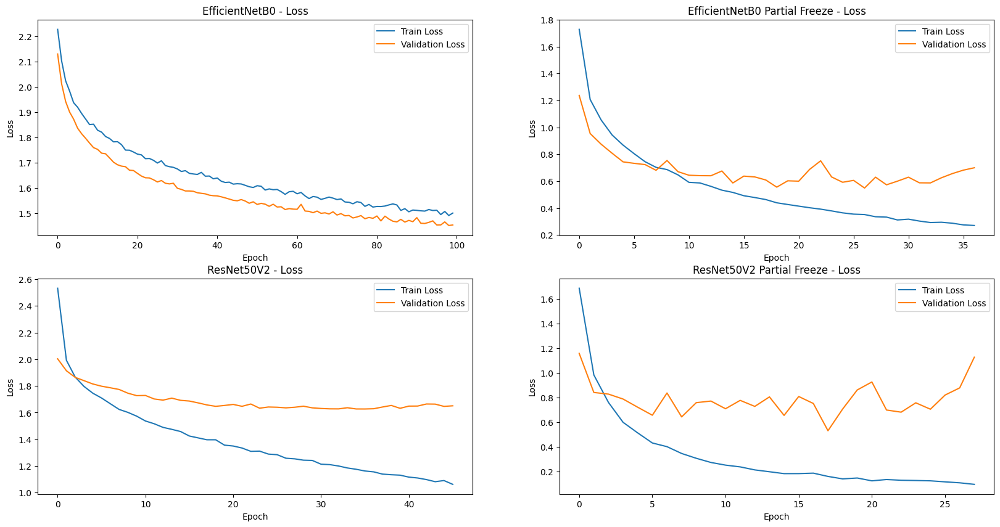

In [15]:
plt.figure(figsize=(20,10))
plt.subplot(2, 2, 1)
plt.plot(history1['loss'], label='Train Loss')
plt.plot(history1['val_loss'], label='Validation Loss')
plt.title('EfficientNetB0 - Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history2['loss'], label='Train Loss')
plt.plot(history2['val_loss'], label='Validation Loss')
plt.title('EfficientNetB0 Partial Freeze - Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history3['loss'], label='Train Loss')
plt.plot(history3['val_loss'], label='Validation Loss')
plt.title('ResNet50V2 - Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(2, 2, 4)
plt.plot(history4['loss'], label='Train Loss')
plt.plot(history4['val_loss'], label='Validation Loss')
plt.title('ResNet50V2 Partial Freeze - Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

Regarding the loss plots, it's observable that the pre-trained models with fully frozen layers have not yet reached convergence. This is indicated by their loss values, which remain quite substantial, specifically above 1.

Conversely, both models employing a partial freeze strategy demonstrate a significant reduction in loss and can be considered to be approaching convergence. Although there's still a noticeable gap between the training loss and validation loss curves, their loss values are now below 1, and the difference between them does not exceed 0.3.


In [16]:
y_true = []
y_pred = []
y_pred2 = []
y_pred3 = []
y_pred4 = []

for image_batch, label_batch in test_ds:
    y_true.extend(label_batch.numpy())

    preds1 = model1.predict(image_batch, verbose=0)
    y_pred.extend(np.argmax(preds1, axis=1))

    preds2 = model2.predict(image_batch, verbose=0)
    y_pred2.extend(np.argmax(preds2, axis=1))

    preds3 = model3.predict(image_batch, verbose=0)
    y_pred3.extend(np.argmax(preds3, axis=1))

    preds4 = model4.predict(image_batch, verbose=0)
    y_pred4.extend(np.argmax(preds4, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_pred2 = np.array(y_pred2)
y_pred3 = np.array(y_pred3)
y_pred4 = np.array(y_pred4)

In [17]:
print("\nClassification Report EfficientNetB0:")
print(classification_report(y_true, y_pred))
print("\nClassification Report EfficientNetB0 Partial Freeze:")
print(classification_report(y_true, y_pred2))
print("\nClassification Report ResNet50V2:")
print(classification_report(y_true, y_pred3))
print("\nClassification Report ResNet50V2 Partial Freeze:")
print(classification_report(y_true, y_pred4))


Classification Report EfficientNetB0:
              precision    recall  f1-score   support

           0       0.63      0.43      0.51       100
           1       0.59      0.41      0.49       100
           2       0.48      0.62      0.54       100
           3       0.46      0.33      0.38       100
           4       0.53      0.54      0.53       100
           5       0.28      0.48      0.35       100
           6       0.62      0.49      0.55       100
           7       0.40      0.43      0.42       100
           8       0.57      0.64      0.60       100
           9       0.61      0.54      0.57       100

    accuracy                           0.49      1000
   macro avg       0.52      0.49      0.49      1000
weighted avg       0.52      0.49      0.49      1000


Classification Report EfficientNetB0 Partial Freeze:
              precision    recall  f1-score   support

           0       0.78      0.77      0.77       100
           1       0.72      0.78      

**Classification Report Evaluation:**
**Base Model: EfficientNetB0**

- Accuracy: 0.49
- Macro Average Recall: 0.49
- Macro Average Precision: 0.52
- Macro Average F1-Score: 0.49
- Best-performing classes:
  - Class 8: F1-score 0.60, recall 0.64
  - Class 6: F1-score 0.55, high precision (0.62), but recall 0.49.
- Worst-performing classes: - Class 5: F1-score 0.35, precision only 0.28 (the model frequently misclassified instances into other classes). - Class 3: F1-score 0.38, recall only 0.33 (the model failed to recognize the majority of data in this class).
  This model exhibited significant difficulty in distinguishing between classes with potentially complex or similar features, such as classes 3 and 5.

**Partial Freeze: EfficientNetB0**

- Accuracy: 0.80
- Macro Average Recall: 0.80
- Macro Average Precision: 0.80
- Macro Average F1-Score: 0.80
- Best-performing classes:
  - Classes 2 & 8: F1-score, recall, and precision ranged between 0.85–0.86.
  - Classes 4 & 6: F1-score 0.85–0.82, with a slight decrease in recall for class 6 (0.74).
- Classes with relatively lower performance: - Class 7: F1-score 0.72. - Class 3: F1-score 0.75.
  All classes were classified reasonably well. Even classes that previously performed poorly, like 3 and 5, now demonstrate more stable performance.

**Base Model: ResNet50V2**

- Accuracy: 0.44
- Macro Average Recall: 0.44
- Macro Average Precision: 0.45
- Macro Average F1-Score: 0.44
- Best-performing classes:
  - Class 2: F1-score 0.58, recall 0.62.
  - Classes 8 & 7: F1-score 0.47–0.50, but with recall higher than precision (indicating the model over-predicted these two labels).
- Worst-performing classes: - Classes 0, 1, 9: F1-score 0.34–0.40, with low precision & recall.
  Numerous false positives and false negatives indicate the model struggled significantly to differentiate between classes.

**Partial Freeze: ResNet50V2**

- Accuracy: 0.84
- Macro Average Recall: 0.84
- Macro Average Precision: 0.84
- Macro Average F1-Score: 0.84
- Best-performing classes:
  - Classes 4 & 8: F1-score 0.92 & 0.89, high recall (the model recognized these two classes with high confidence and accuracy).
  - Classes 2, 1, 3: F1-score 0.83–0.86, high recall indicates consistency and strong classification capability.
- Classes with relatively lower performance: - Classes 6 & 7: F1-score 0.80–0.81, recall of 0.74 for class 6 (still very good, but slightly lower compared to other classes).
  This is the most stable and consistent model. No class had an F1-score below 0.80. Even class 6, which was challenging for other models, was classified adequately.


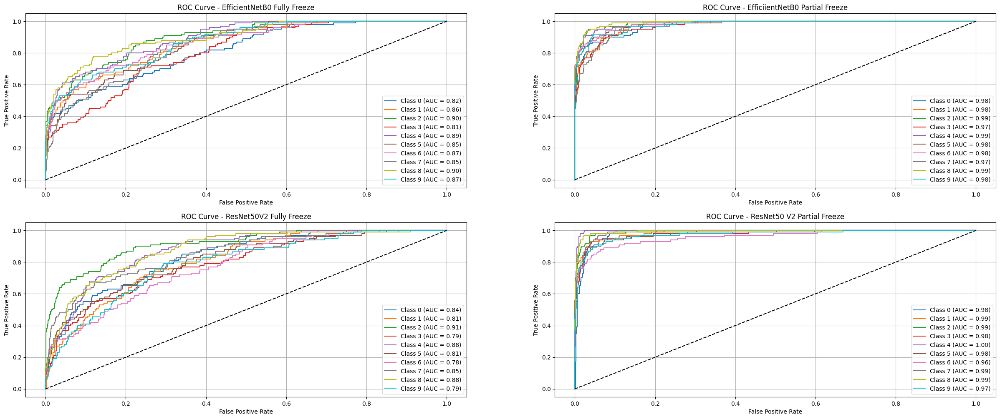

In [18]:
y_true = []
y_prob1 = []
y_prob2 = []
y_prob3 = []
y_prob4 = []

for image_batch, label_batch in test_ds:
    y_true.extend(label_batch.numpy())
    y_prob1.extend(model1.predict(image_batch, verbose=0))
    y_prob2.extend(model2.predict(image_batch, verbose=0))
    y_prob3.extend(model3.predict(image_batch, verbose=0))
    y_prob4.extend(model4.predict(image_batch, verbose=0))

y_true = np.array(y_true)
y_prob1 = np.array(y_prob1)
y_prob2 = np.array(y_prob2)
y_prob3 = np.array(y_prob3)
y_prob4 = np.array(y_prob4)

n_classes = y_prob1.shape[1]
y_true_bin = label_binarize(y_true, classes=np.arange(n_classes))

plt.figure(figsize=(30, 25))

# Model 1
plt.subplot(4, 2, 1)
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_prob1[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.title('ROC Curve - EfficientNetB0 Fully Freeze')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid(True)

# Model 2
plt.subplot(4, 2, 2)
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_prob2[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.title('ROC Curve - EfficiientNetB0 Partial Freeze')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid(True)

# Model 3
plt.subplot(4,2,3)
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_prob3[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.title('ROC Curve - ResNet50V2 Fully Freeze')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid(True)

# Model 4
plt.subplot(4, 2, 4)
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_prob4[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.title('ROC Curve - ResNet50 V2 Partial Freeze')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid(True)


ROC-AUC is important because it indicates how well a model can distinguish between different classes. A high AUC signifies that the model is proficient at differentiating drug types, and this is crucial in situations where false positives and false negatives have significant impacts. Misclassifying a drug could lead to incorrect identification; for instance, a patient trying to identify Drug A, which is suitable for them, might have it misclassified by the model as Drug B, potentially leading to confusion or issues if Drug B could worsen their symptoms.

1. **EfficientNetB0 Fully Freeze**\
   In this model, the AUC scores range between 0.81 and 0.90. The model best recognizes classes 2 and 8 with an AUC score of 0.90, indicating that the model can separate these classes reasonably well even though the entire backbone was not retrained. However, the lowest performance was observed for class 3 with an AUC of 0.81, indicating that the model had more difficulty distinguishing this class compared to others. Since this model did not adjust the backbone weights, the captured feature information might not be sufficiently specific for this classification task.

2. **EfficientNetB0 Partial Freeze**\
   This model shows a significant improvement compared to the base model (fully freeze), with AUC scores ranging from 0.97 to 0.99. This indicates that the model has an excellent capability to distinguish between classes, approaching near perfection. The best-performing class is class 2 with an AUC score of 0.99, signifying that the model is very confident in recognizing and distinguishing this class from others. This improvement can be attributed to the partial freeze strategy, where some blocks in the backbone were unfrozen, allowing the model to learn more data-specific features, resulting in much better class separation.

3. **ResNet50V2 Fully Freeze**\
   For this model, AUC scores ranged from 0.78 to 0.91, indicating a somewhat varied performance in distinguishing between classes. Although some classes were recognized well, such as class 2 which recorded the highest AUC score of 0.91, weaknesses remained in distinguishing other classes, particularly class 6 with the lowest AUC score of 0.78. This suggests that while the model has learned some important patterns, there is still potential for improvement, especially in recognizing classes that are difficult to differentiate.

4. **ResNet50V2 Partial Freeze**\
   In this model, AUC scores ranged between 0.96 and 1.00, reflecting the model's excellent performance in distinguishing all classes. Notably, for class 4 with a perfect AUC score (1.00), the model demonstrated complete confidence in distinguishing that class. This performance enhancement is very likely influenced by the partial freeze strategy, where some blocks of the ResNet were unfrozen. This approach allowed the model to adjust its weights to the training data and learn more task-specific features, thereby significantly improving its classification and class separation capabilities.


# Attention Map


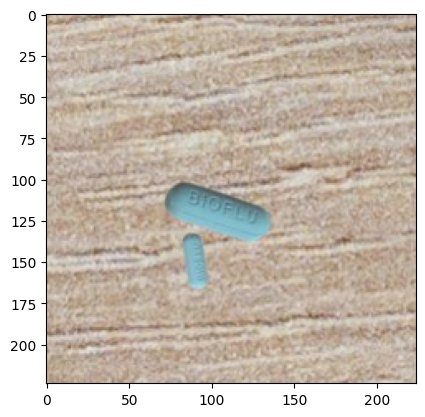

In [19]:
img = cv2.imread("/kaggle/working/split_data/test/Bioflu/00000013.jpg")[:,:,::-1]
img = cv2.resize(img, (224, 224))
ax = plt.imshow(img)


## Base Model EfficientNetB0 Attention Map


In [20]:
def preprocess_effnet(img):
  img = preprocess_efficientnetb0(img)
  return np.expand_dims(img, 0)

input_effnet = preprocess_effnet(img)

In [21]:
def get_activations_effnet(input_effnet, layer_idx=200):
    base_model = model1.layers[0]  
    out_layer = base_model.layers[layer_idx]  
    model = models.Model(inputs=base_model.input, outputs=out_layer.output)
    return model.predict(input_effnet)

In [22]:
def postprocess_activations(activations):
  output = np.abs(activations)
  output = np.sum(output, axis = -1).squeeze()
  output = cv2.resize(output, (224, 224))
  output /= output.max()
  output *= 255
  return 255 - output.astype('uint8')

In [23]:
def apply_heatmap(weights, img):
  heatmap = cv2.applyColorMap(weights, cv2.COLORMAP_JET)
  heatmap = cv2.addWeighted(heatmap, 0.7, img, 0.3, 0)
  return heatmap

In [24]:
def plot_heatmaps_effnet(rng):
  level_maps = None

  for i in rng:
    activations = get_activations_effnet(input_effnet, i)
    weights = postprocess_activations(activations)
    heatmap = apply_heatmap(weights, img)
    if level_maps is None:
      level_maps = heatmap
    else:
      level_maps = np.concatenate([level_maps, heatmap], axis = 1)
  plt.figure(figsize=(15, 15))
  plt.axis('off')
  ax = plt.imshow(level_maps)

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


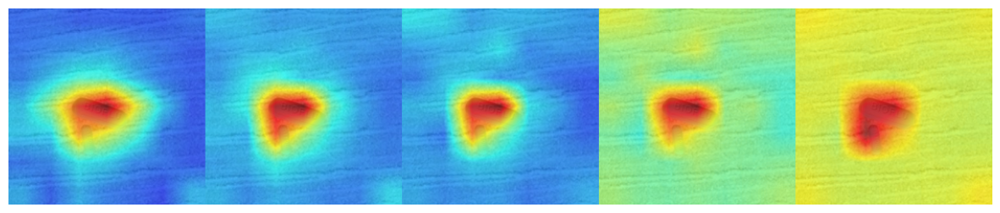

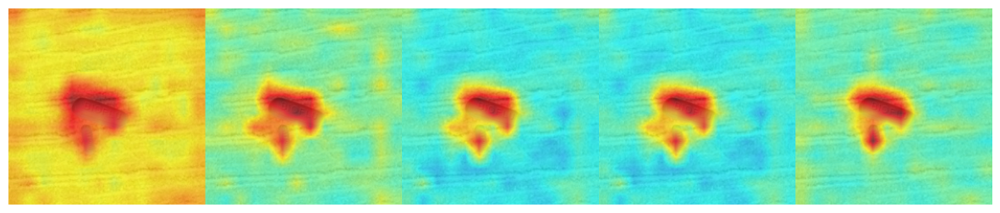

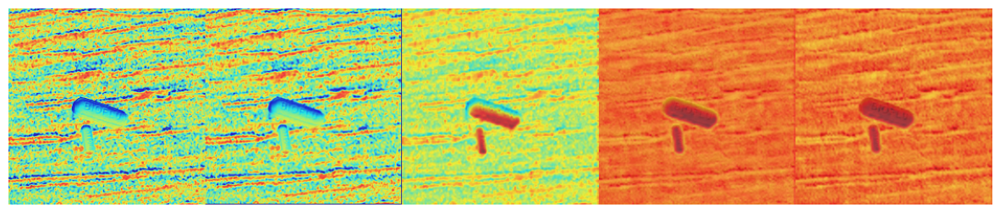

In [25]:
plot_heatmaps_effnet(range(220, 225))
plot_heatmaps_effnet(range(100, 105))
plot_heatmaps_effnet(range(3, 8))

## Modified Model Using EfficientNetB0 Partial Freeze Attention Map


In [26]:
def get_activations_effnetpartial(input_effnet, layer_idx=200):
    base_model = model2.layers[0]  
    out_layer = base_model.layers[layer_idx]  
    model = models.Model(inputs=base_model.input, outputs=out_layer.output)
    return model.predict(input_effnet)

In [27]:
def plot_heatmaps_effnetpartial(rng):
  level_maps = None

  for i in rng:
    activations = get_activations_effnetpartial(input_effnet, i)
    weights = postprocess_activations(activations)
    heatmap = apply_heatmap(weights, img)
    if level_maps is None:
      level_maps = heatmap
    else:
      level_maps = np.concatenate([level_maps, heatmap], axis = 1)
  plt.figure(figsize=(15, 15))
  plt.axis('off')
  ax = plt.imshow(level_maps)

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


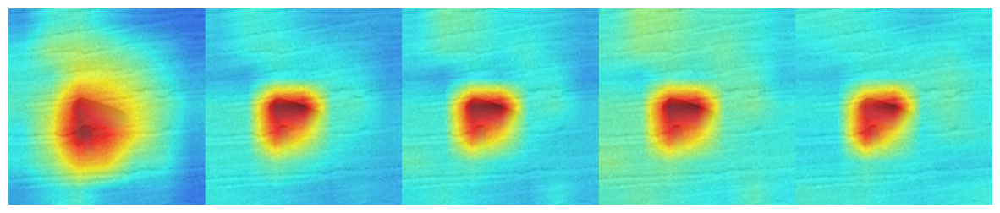

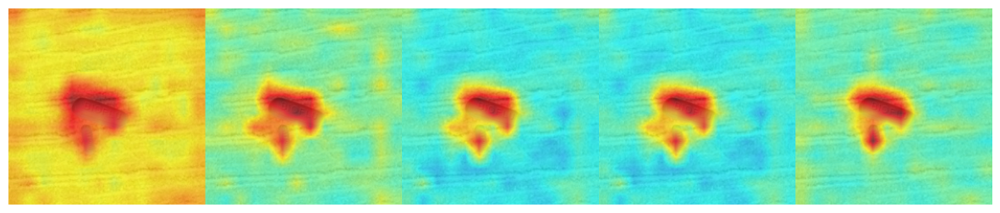

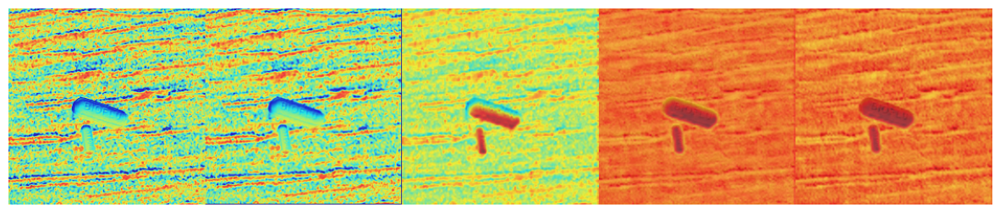

In [28]:
plot_heatmaps_effnetpartial(range(220, 225))
plot_heatmaps_effnetpartial(range(100, 105))
plot_heatmaps_effnetpartial(range(3, 8))

## Base Model ResNet50V2 Attention Map


In [29]:
def preprocess_resnet(img):
  img = preprocess_resnet50v2(img)
  return np.expand_dims(img, 0)
    
input_image = preprocess_resnet(img)

In [30]:
def get_activations_resnet(input_image, layer_idx=164):
    base_model = model3.layers[0] 
    out_layer = base_model.layers[layer_idx]  
    model = models.Model(inputs=base_model.input, outputs=out_layer.output)
    return model.predict(input_image)

In [31]:
def plot_heatmaps_resnet(rng):
  level_maps = None
  
  for i in rng:
    activations = get_activations_resnet(input_image, i)
    weights = postprocess_activations(activations)
    heatmap = apply_heatmap(weights, img)
    if level_maps is None:
      level_maps = heatmap
    else:
      level_maps = np.concatenate([level_maps, heatmap], axis = 1)
  plt.figure(figsize=(15, 15))
  plt.axis('off')
  ax = plt.imshow(level_maps)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


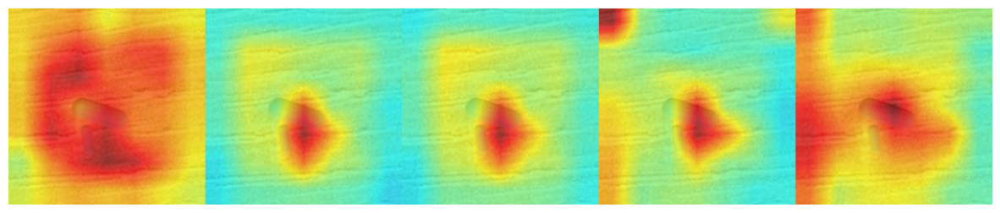

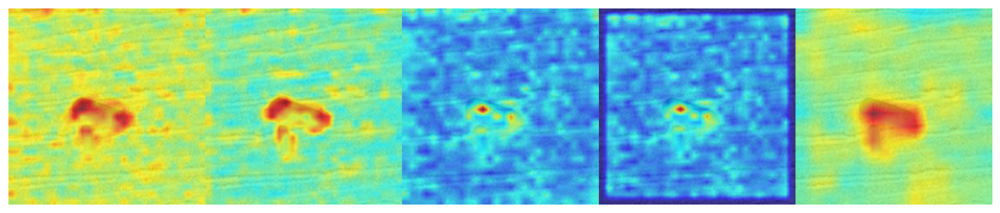

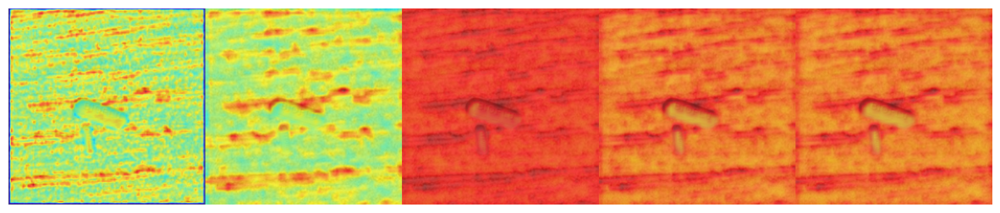

In [32]:
plot_heatmaps_resnet(range(164, 169))
plot_heatmaps_resnet(range(76, 81))
plot_heatmaps_resnet(range(3, 8))

## Modified Model Using ResNet50V2 Partial Freeze Attention Map


In [33]:
def get_activations_resnetpartial(input_image, layer_idx=164):
    base_model = model4.layers[0] 
    out_layer = base_model.layers[layer_idx]  
    model = models.Model(inputs=base_model.input, outputs=out_layer.output)
    return model.predict(input_image)

In [34]:
def plot_heatmaps_resnetpartial(rng):
  level_maps = None
  
  for i in rng:
    activations = get_activations_resnetpartial(input_image, i)
    weights = postprocess_activations(activations)
    heatmap = apply_heatmap(weights, img)
    if level_maps is None:
      level_maps = heatmap
    else:
      level_maps = np.concatenate([level_maps, heatmap], axis = 1)
  plt.figure(figsize=(15, 15))
  plt.axis('off')
  ax = plt.imshow(level_maps)


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


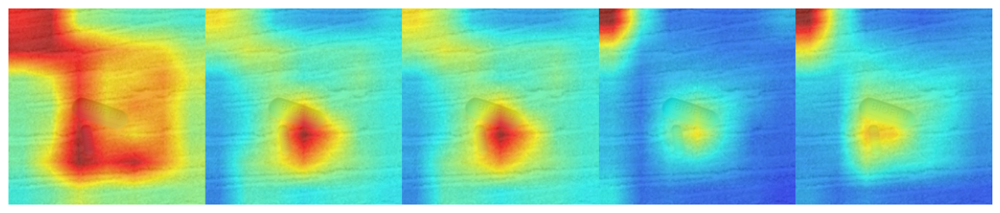

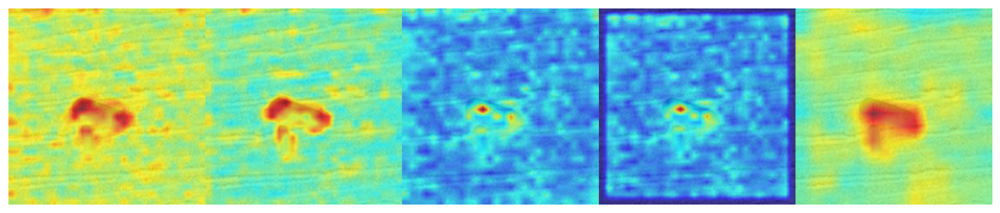

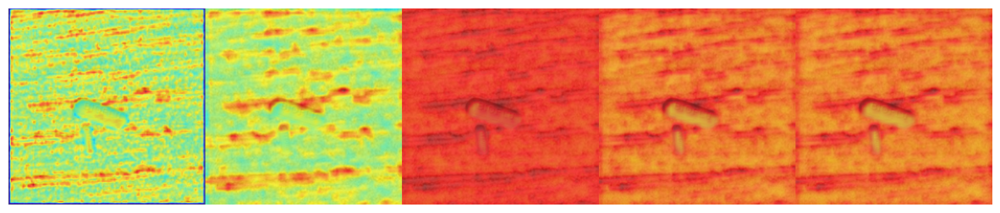

In [35]:
plot_heatmaps_resnetpartial(range(164, 169))
plot_heatmaps_resnetpartial(range(76, 81))
plot_heatmaps_resnetpartial(range(3, 8))

An Attention Map is a method used to visualize areas within an image to see whether the model is truly focusing on the object of prediction, or if it is being distracted by parts of the image that are noise or irrelevant information.

Below is the explanation for the attention map visualizations we conducted:

- First, we visualized the **initial 5 layers**, which are responsible for **extracting basic features** like the shapes and patterns of objects in the image. At this stage, the model is still recognizing general features.
- Next, visualizing the **5 middle layers** shows that the model begins to **focus its attention on the main object**, identifying more specific parts of that object.
- Finally, visualizing the **last 5 layers** is used to see if the model is genuinely focused on the predicted object. A significant **difference** becomes apparent here between the model with **fully frozen layers** and the one with **partial freezing**, as partial freezing enables the model to learn a more **precise focus** on the target object.

For models 1 and 2 (EfficientNetB0 fully freeze and partial freeze), it was observed that both models were capable of focusing their attention on the main object. However, the model with partial freezing demonstrated an ability to direct its focus to the object more quickly.

As for models 3 and 4 (ResNet50V2 fully freeze and partial freeze), model 3 tended to be less focused, with its attention scattered across the entire image, leading to imprecise highlighting of the main object. However, model 4, which utilized partial freezing, showed a significant improvement. The model became more focused on the object, although some of its attention still lingered on noisy areas within the image.


# Insight

## Key Takeaways

- **Unfreezing several layers is highly impactful.**\
  The partially frozen models showed a large jump in accuracy (EfficientNet: +31%, ResNet50V2: +40%), and F1-scores across all classes increased significantly. This indicates that partial freezing helps the model learn from and adapt to the new data.

- **A fully frozen backbone limits adaptation capability.**\
  Without fine-tuning, the models rely solely on generic features from their pre-training. This is not robust enough for a multi-class classification task like this one, as evidenced by accuracies below 50% and unstable F1-scores.

- **The partially frozen ResNet50V2 model is the most stable.**\
  With partial freezing, the ResNet50V2 model achieved an F1-score of ≥ 0.80 across all classes. Classes that were difficult for other models to distinguish were also handled well by this model. Furthermore, since this model also achieved the highest accuracy and AUC scores, we can conclude that the partially frozen ResNet50V2 is the best model for this use case.


## Existing Challenges

- There may be **visual similarity** between medications. For example, there may be many medications looking as small red circle. Because CNN models will look at the image features, there is a high risk in misclassifying the medication especially when they look similar.
- **Real life data** may be more **noisy** and have different lighting conditions (maybe from poor lighting, poor camera). Real data may be blurry or even occluded, so this increases the probability of misclassifying medication.
- The model **has not been tested with REAL data**. We just tested the model with the test dataset, which may be similar with the train dataset. To understand how it performs in real life situation, we have to test with real medications.
- The model has **limited dataset scope**, still limited to 10 classes. While in real life, medication types can be up to thousands, which may increase the complexity by a lot. Sticking to 10 classes, the model cannot be applicable to many kinds of medications -> not so flexible or useful.

---

## Future Opportunities

- To avoid misclassifying the images solely because the visual looks alike, we can combine more inputs (using **multimodal input**). We can combine metadata like the manufacturer name. This helps the model to limit their choices of medications.
- Other than multimodal input, we can also **give the users more details on the medication**. For example, if the model predicts "Fish Oil", we can provide the information of Fish Oil as well (what is it for, where can we find it, the dosage etc). This helps the user to double check if the predicted output and the usage aligns with their needs or not. Users can understand where they can find the medication as well.
- By integrating the "Where users can find this medication" to the application or platform, we can **collaborate with businesses or apothecary** such as Guardian, Century, or even local pharmacies. We will display the stores that are our patrons -> helps users in finding the medications, and we get benefits from partnerships and subscription fee (so they have a kind of admin fee to be "featured" in the app).
- Add more **datasets from different medications**, step by step, so the model is more diverse and usable for many kinds of medications.
- Many people currently are facing difficulties in ordering medications. They may know the shape or have the image of it, but do not know the medication name. Often, medication name is complex and hard-to-memorize. This model provides help for users to identify their medication easily.
